In [1]:
%matplotlib inline

In [2]:
import matplotlib.pyplot as plt
import matplotlib.path as mpath
import xarray as xr
import numpy as np
import matplotlib.dates as mdates
import datetime as dt
import time
import sys
import glob
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import math
import imageio
import warnings
import os
warnings.filterwarnings('ignore')

In [ ]:
# plot gif of steering flow
images = []
os.chdir('/home/Tyler.Barbero/tmp/')
filenames = sorted(os.listdir('/home/Tyler.Barbero/tmp/'))
for filename in filenames:
    images.append(imageio.imread(filename))
    imageio.mimsave("/home/Tyler.Barbero/tmp/synoptic_movie.gif", images,duration=0.5)

In [3]:
def setup_m(ax):

#     ax = plt.axes(projection=ccrs.PlateCarree())
    ax.set_global()
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.LAND)
    t1 = ax.gridlines(draw_labels=True,alpha=0.2)
    t1.xlabels_top = False
    t1.ylabels_right = False
    ax.set_extent([-101,0,-1,60])

    return ax

def vert_avg_winds(u,v):
    # take in wind fields from 300mb to 850mb and average them
    # return u,v vertically averaged (300-850mb) wind fields
    
    # assign empty arrays 
    u_bar = np.zeros(np.shape(u[0,0,:,:]))
    v_bar = np.zeros(np.shape(v[0,0,:,:]))
    
    # assign empty 3d wind arrays 
    lev_bot = int(np.where(u['level']==850)[0])
    lev_top = int(np.where(u['level']==300)[0])
    diff = abs(lev_top-lev_bot)
    wind3du = np.zeros([len(u[0,0,:,0]),len(u[0,0,0,:]),diff])
    wind3dv = np.zeros([len(u[0,0,:,0]),len(u[0,0,0,:]),diff])
    
    # assign wind data to 3d array to easily average
    ii=0
    for i in range(lev_top,lev_bot):
        wind3du[:,:,ii] = u[0,i,:,:]
        wind3dv[:,:,ii] = v[0,i,:,:]
        ii=ii+1
        
    # average over 3rd dim
    u_bar[:,:] = np.mean(wind3du,2)
    v_bar[:,:] = np.mean(wind3dv,2)
    
    return u_bar,v_bar


# Read files

In [48]:
GFS_root = '/archive/twb/GFS/2017091700/20170917_00Z_'
IFS_root = '/archive/twb/IFS/1_FC0_20170917_0'
SGFS_root = '/archive/twb/SHiELD_gfsIC/20170917_00Z_SHiELD_gfsIC_4xdaily_'
SIFS_root = '/archive/twb/SHiELD_ifsIC/20170917_00Z_SHiELD_gfsIC_4xdaily_'
ana_root = '/archive/twb/IFS/1_AN0_'
PV_root = '/archive/twb/pv_inversion/GFS/2017091700/20170917_00Z_sqinvph.nc'
transform = ccrs.PlateCarree()

# open GFS FC files
hf_GFS = xr.open_dataset(GFS_root + 'h_360x180.nc')
uf_GFS = xr.open_dataset(GFS_root + 'u_360x180.nc')
vf_GFS = xr.open_dataset(GFS_root + 'v_360x180.nc') 

lat_GFS = hf_GFS['latitude']
lon_GFS = hf_GFS['longitude']
h_GFS = hf_GFS['hgt']
u_GFS = uf_GFS['uwind']
v_GFS = vf_GFS['vwind']
lev_GFS = int(np.where(hf_GFS['lev']==500)[0])
# u_bar_GFS,v_bar_GFS = vert_avg_winds(u_GFS,v_GFS)

# open IFS FC files
hf_IFS = xr.open_dataset(IFS_root + '.z.nc')
uf_IFS = xr.open_dataset(IFS_root + '.u.nc')
vf_IFS = xr.open_dataset(IFS_root + '.v.nc')

lat_IFS = hf_IFS['latitude']
lon_IFS = hf_IFS['longitude']
h_IFS = hf_IFS['z']/9.8
u_IFS = uf_IFS['u']
v_IFS = vf_IFS['v']
lev_IFS = int(np.where(hf_IFS['level']==500)[0])

# open SGFS FC files
hf_SGFS = xr.open_dataset(SGFS_root+'h_1deg.nc')
uf_SGFS = xr.open_dataset(SGFS_root+'u_1deg.nc')
vf_SGFS = xr.open_dataset(SGFS_root+'v_1deg.nc')

lat_SGFS = hf_SGFS['grid_xt']
lon_SGFS = hf_SGFS['grid_yt']
h_SGFS = hf_SGFS['h_plev']
u_SGFS = uf_SGFS['u_plev']
v_SGFS = vf_SGFS['v_plev']
lev_SGFS = int(np.where(hf_SGFS['plev']==500)[0])


# open SIFS FC files
hf_SIFS = xr.open_dataset(SIFS_root+'h_1deg.nc')
uf_SIFS = xr.open_dataset(SIFS_root+'u_1deg.nc')
vf_SIFS = xr.open_dataset(SIFS_root+'v_1deg.nc')

lat_SIFS = hf_SIFS['grid_xt']
lon_SIFS = hf_SIFS['grid_yt']
h_SIFS = hf_SIFS['h_plev']
u_SIFS = uf_SIFS['u_plev']
v_SIFS = vf_SIFS['v_plev']
lev_SIFS = int(np.where(hf_SIFS['plev']==500)[0])



# open pv FC (GFS) file
pvf = xr.open_dataset(PV_root)

lat_pv = pvf['lat']
lon_pv = pvf['lon']
pv_pv = pvf['pv']
time_pv = pvf['time']
u_pv = pvf['u']
v_pv = pvf['v']
lev_pv = int(np.where(pvf['lev']==500)[0])



# Plotting

In [45]:
d = az['time']
fd = d.dt.strftime("%Y%m%d %hZ")[0].values
str(fd)

'20170917 SepZ'

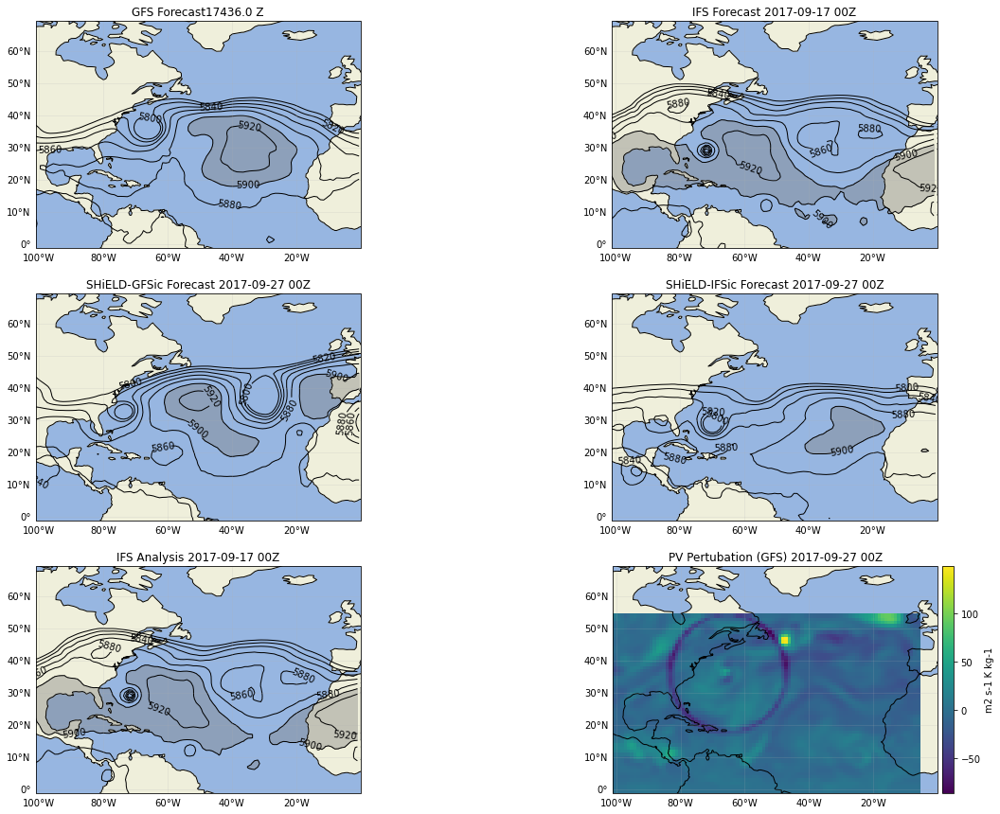

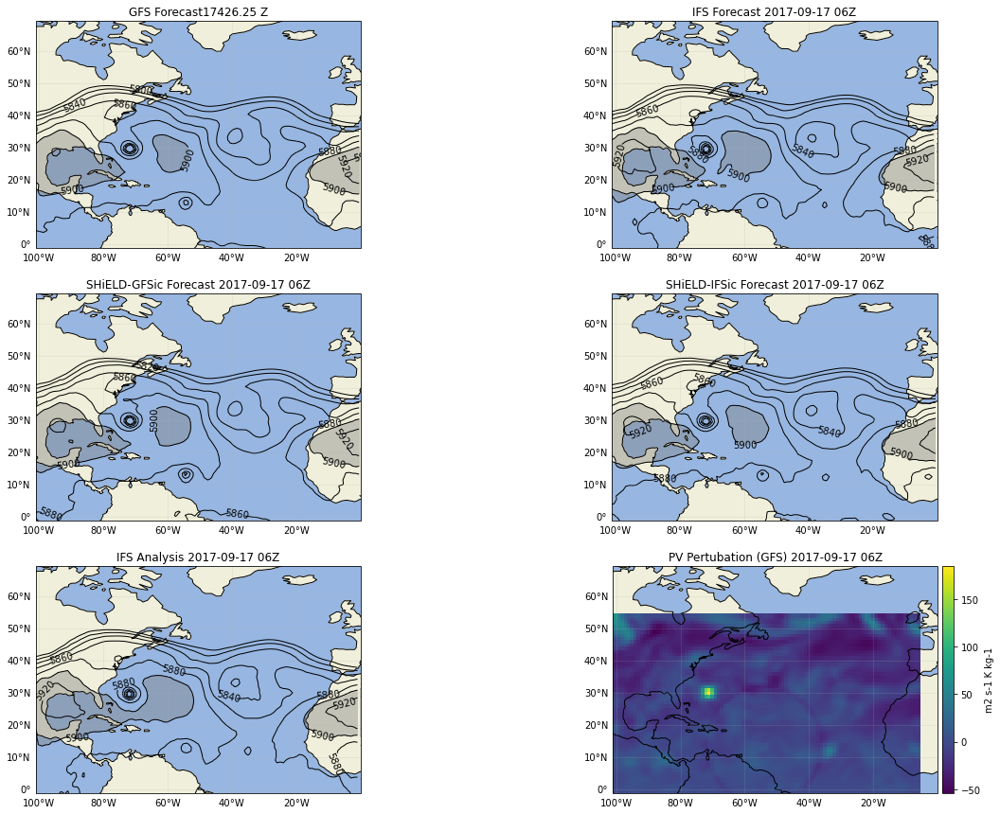

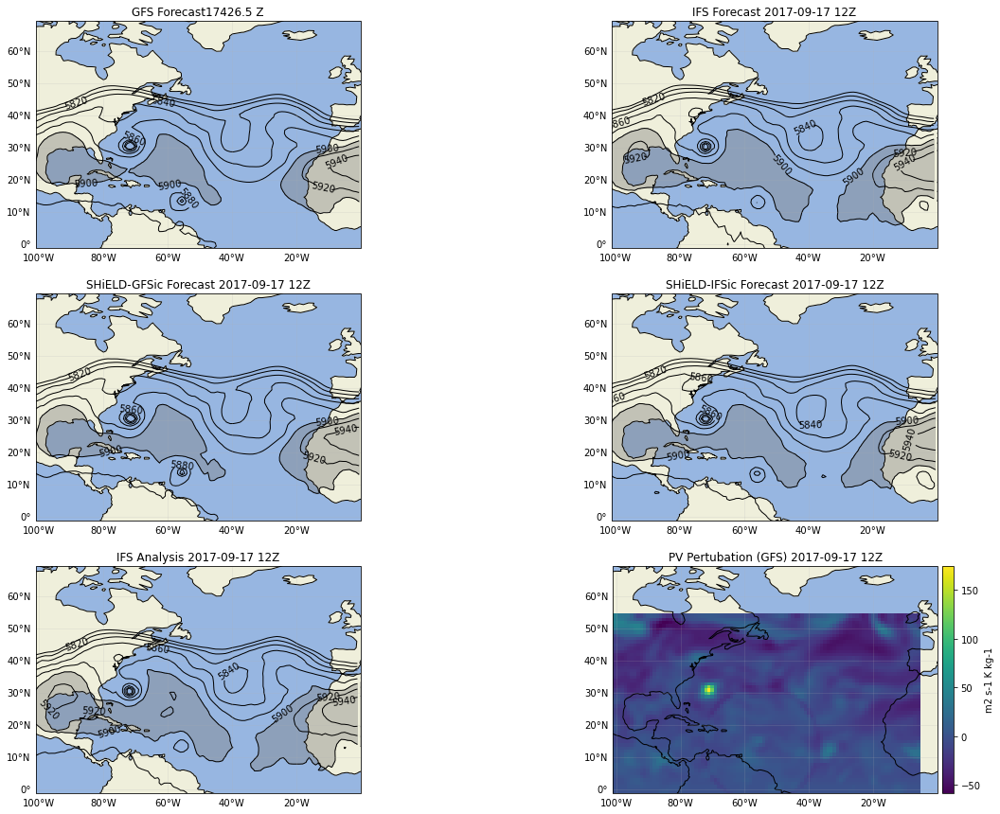

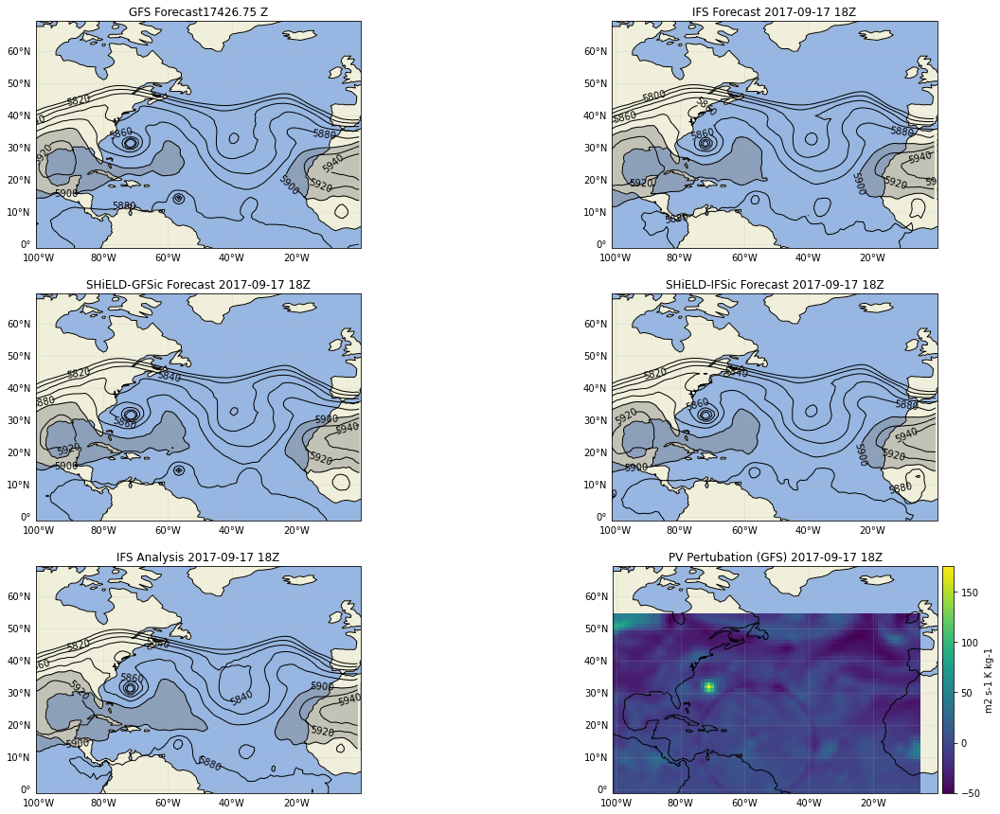

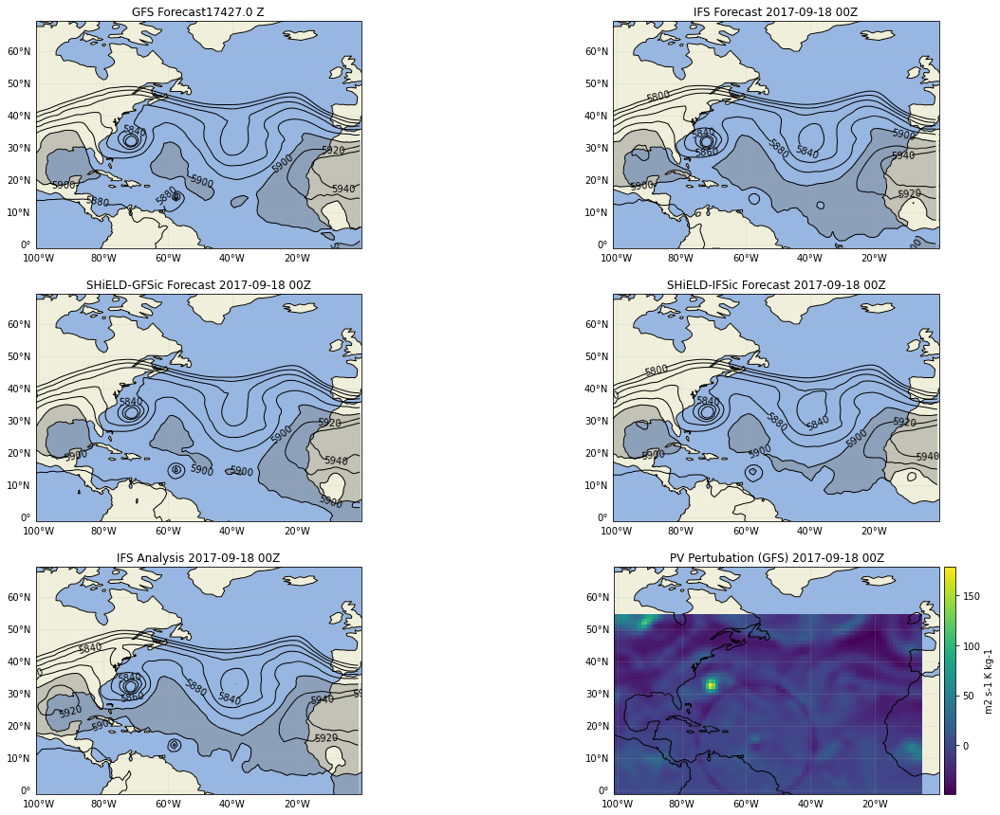

...

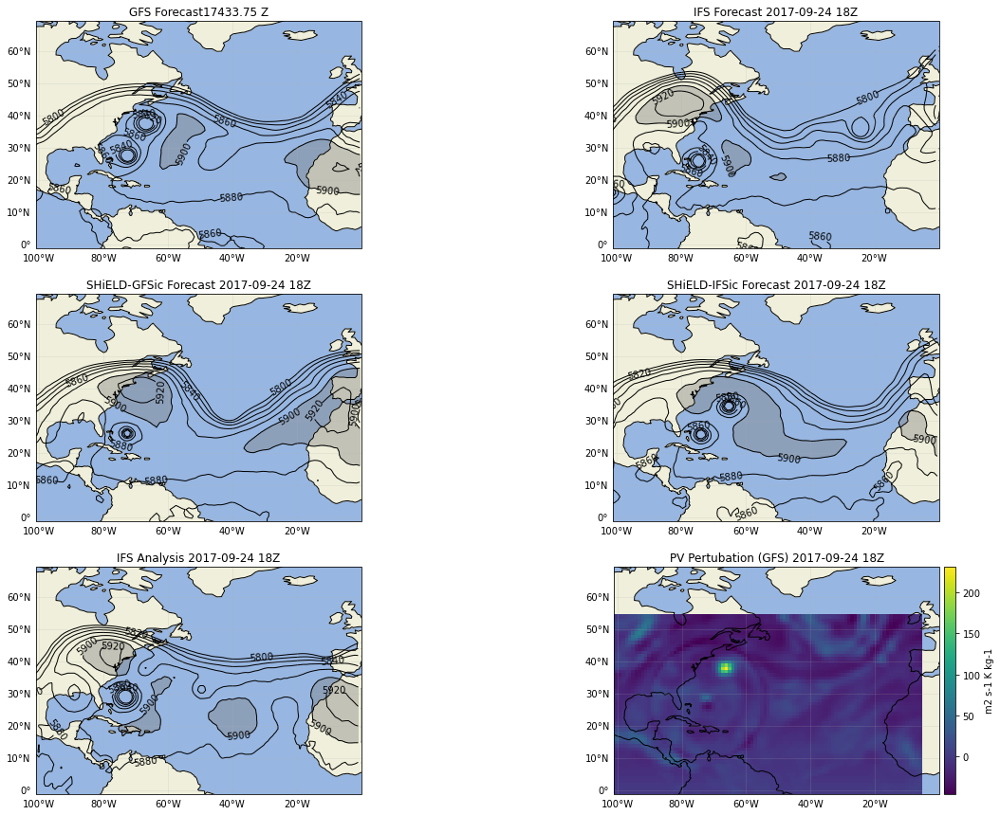

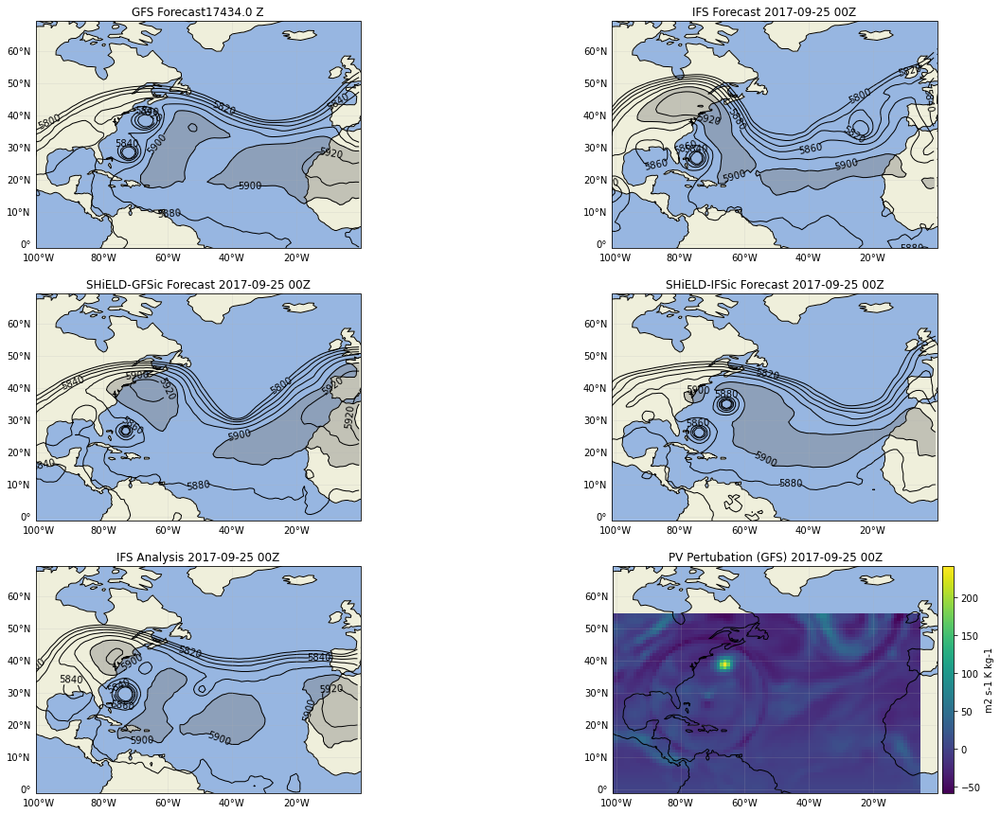

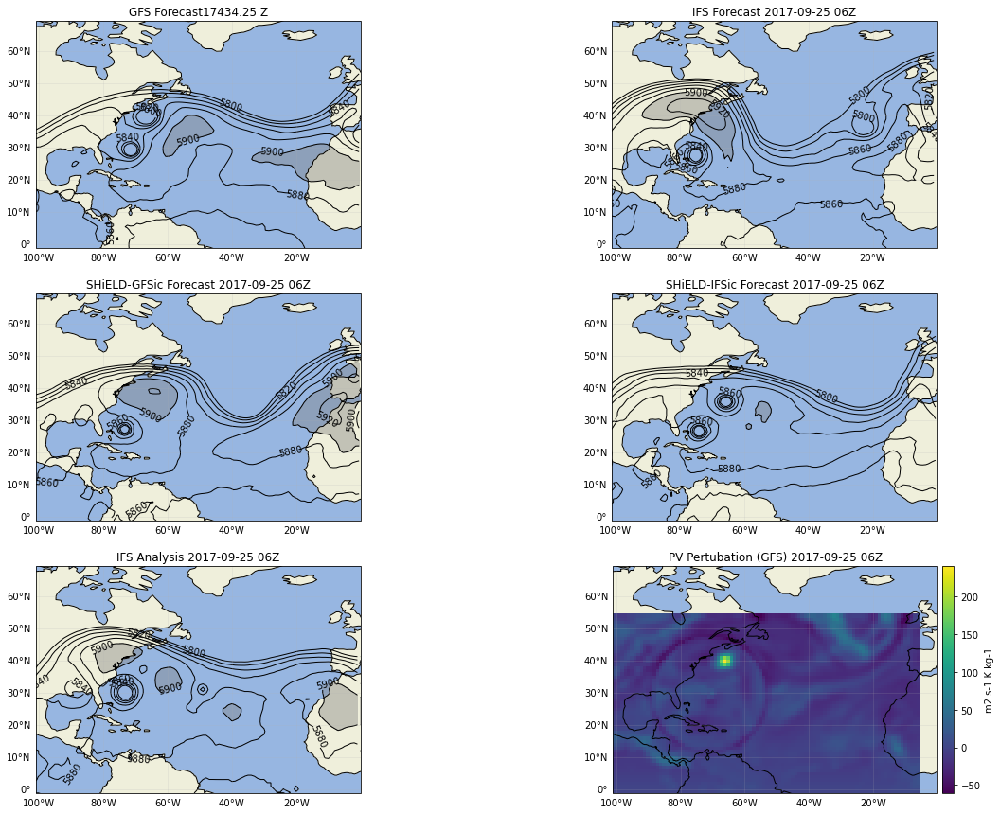

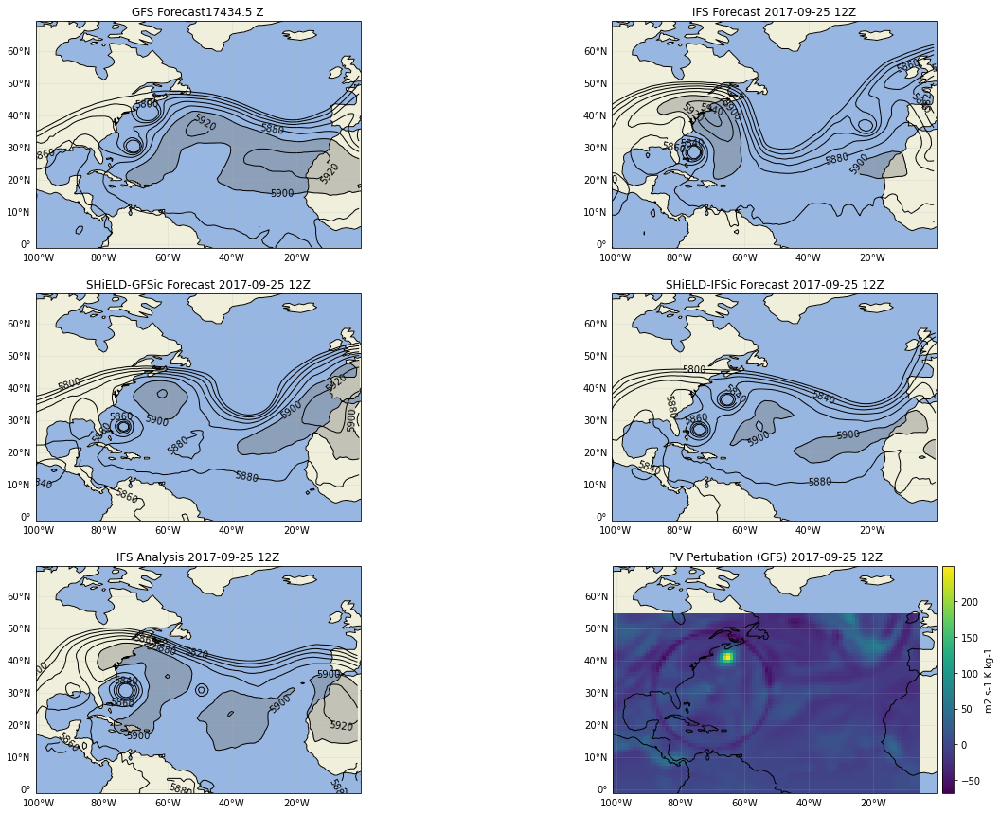

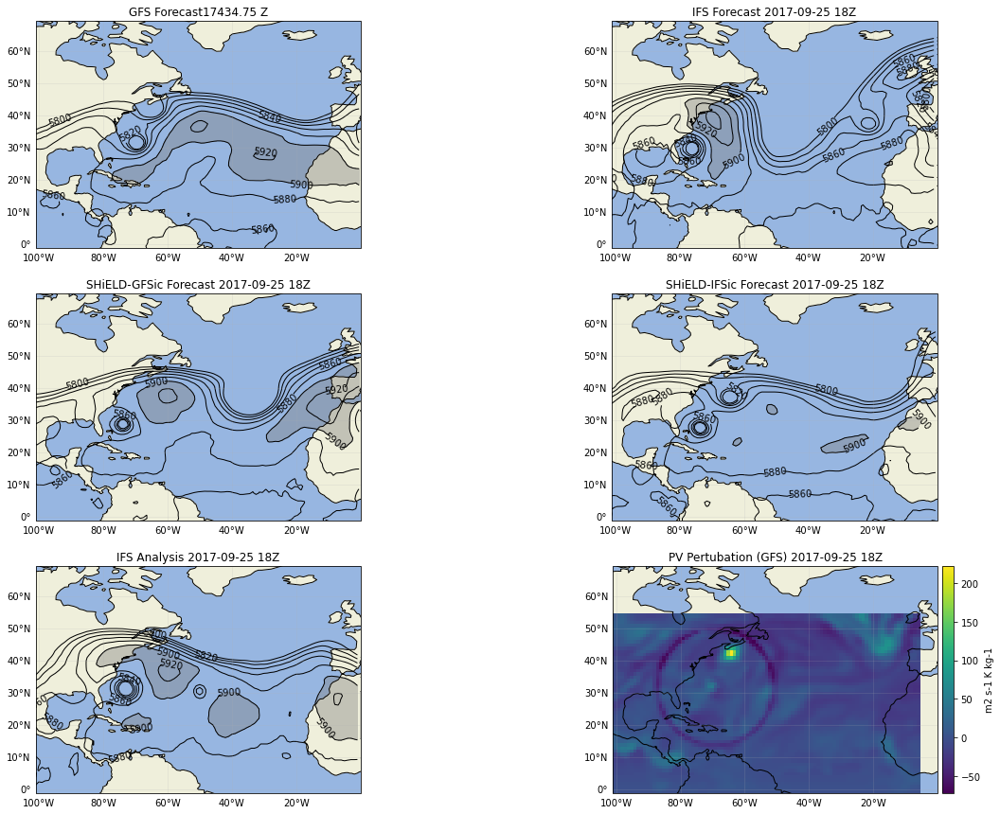

In [ ]:
ini_times = ['20170917','20170918','20170919','20170920','20170921','20170922','20170923','20170924',
            '20170925','20170926']

# ini_times = ['20170917']
ini_hours = ['0','600','1200','1800']
# ini_hours = ['0','600']

i=-1 # FC files index

for ini_time in ini_times:
    for ini_hour in ini_hours:
        # setup figure/axes
        fig, axs = plt.subplots(3,2, figsize=(20,15))
        fig.patch.set_facecolor('white')
        # ANALYSIS IFS  ##########################
        axs[2,0] = plt.subplot(3,2,5, projection=ccrs.PlateCarree())
        setup_m(axs[2,0])       
        
        # IFS analysis comparison files  
        an_z = ana_root + ini_time + '_' + ini_hour + '.z.nc'
        an_u = ana_root + ini_time + '_' + ini_hour + '.u.nc'
        an_v = ana_root + ini_time + '_' + ini_hour + '.v.nc'
        
        az = xr.open_dataset(an_z)
        au = xr.open_dataset(an_u)
        av = xr.open_dataset(an_v)
        
        lat_a = az['latitude']
        lon_a = az['longitude']
        h_a = az['z']/9.8
        u_a = au['u']
        v_a = av['v']
        lev_a = int(np.where(az['level']==500)[0])
        # get vert avg winds 
#         u_bar_a,v_bar_a = vert_avg_winds(u_a,v_a)
    
    
    
        plt.contourf(lon_a,lat_a,h_a[0,lev_a,:,:],levels=[5900,6200],colors='grey',alpha=0.4,transform=transform)
        sf = plt.contour(lon_a,lat_a,h_a[0,lev_a,:,:],linewidths=1,levels=np.arange(5800,5960,20), colors='black',transform=transform)
        axs[2,0].clabel(sf, fmt='%g',inline_spacing=1)
        tt = str(np.array(az['time'][0]))
        
#         plt.barbs(lon_a[::2],lat_a[::2],u_bar_a[::2,::2],v_bar_a[::2,::2]
#                   ,transform=ccrs.PlateCarree(),length=5)
        
        plt.title("IFS Analysis "+tt[0:10]+" "+tt[11:13]+"Z")
        
#         # GFS model #################################
        axs[0,0] = plt.subplot(3,2,1, projection=ccrs.PlateCarree())
        setup_m(axs[0,0])
        plt.contourf(lon_GFS,lat_GFS,h_GFS[i,lev_GFS,:,:],levels=[5900,6200],colors='grey',alpha=0.4,transform=transform)
        sf = plt.contour(lon_GFS,lat_GFS,h_GFS[i,lev_GFS,:,:],linewidths=1,levels=np.arange(5800,5960,20), colors='black',transform=transform)
        axs[0,0].clabel(sf, fmt='%g',inline_spacing=1)
        tt = str(np.array(hf_GFS['time'][i]))
        plt.title("GFS Forecast"+tt[0:10]+" "+tt[11:13]+"Z" )
        
#         # IFS model #################################        
        axs[0,1] = plt.subplot(3,2,2, projection=ccrs.PlateCarree())
        setup_m(axs[0,1])
        plt.contourf(lon_IFS,lat_IFS,h_IFS[i+1,lev_IFS,:,:],levels=[5900,6200],colors='grey',alpha=0.4,transform=transform)
        sf = plt.contour(lon_IFS,lat_IFS,h_IFS[i+1,lev_IFS,:,:],linewidths=1,levels=np.arange(5800,5960,20), colors='black',transform=transform)
        axs[0,1].clabel(sf, fmt='%g',inline_spacing=1)
        tt = str(np.array(hf_IFS['time'][i+1]))
        plt.title("IFS Forecast "+tt[0:10]+" "+tt[11:13]+"Z")
#         plt.barbs(lon_f[::2],lat_f[::2],u_bar_f[::2,::2],v_bar_f[::2,::2]
#                   ,transform=ccrs.PlateCarree(),length=5)
        
        # SGFS model #################################
        axs[1,0] = plt.subplot(3,2,3, projection=ccrs.PlateCarree())
        setup_m(axs[1,0])
        plt.contourf(lat_SGFS,lon_SGFS,h_SGFS[i,lev_SGFS,:,:],levels=[5900,6200],colors='grey',alpha=0.4,transform=transform)
        sf = plt.contour(lat_SGFS,lon_SGFS,h_SGFS[i,lev_SGFS,:,:],linewidths=1,levels=np.arange(5800,5960,20), colors='black',transform=transform)
        axs[1,0].clabel(sf, fmt='%g',inline_spacing=1)
        tt = str(np.array(hf_SGFS['time'][i]))
        plt.title("SHiELD-GFSic Forecast "+tt[0:10]+" "+tt[11:13]+"Z")
#         plt.barbs(lon_f[::2],lat_f[::2],u_bar_f[::2,::2],v_bar_f[::2,::2]
#                   ,transform=ccrs.PlateCarree(),length=5)


        # IGFS model #################################
        axs[1,1] = plt.subplot(3,2,4, projection=ccrs.PlateCarree())
        setup_m(axs[1,1])
        plt.contourf(lat_SIFS,lon_SIFS,h_SIFS[i,lev_SIFS,:,:],levels=[5900,6200],colors='grey',alpha=0.4,transform=transform)
        sf = plt.contour(lat_SIFS,lon_SIFS,h_SIFS[i,lev_SIFS,:,:],linewidths=1,levels=np.arange(5800,5960,20), colors='black',transform=transform)
        axs[1,1].clabel(sf, fmt='%g',inline_spacing=1)
        tt = str(np.array(hf_SIFS['time'][i]))
        plt.title("SHiELD-IFSic Forecast "+tt[0:10]+" "+tt[11:13]+"Z")
        
        
        
#         # PV pertubation #####################################
        axs[2,1] = plt.subplot(3,2,6,projection=ccrs.PlateCarree())
        setup_m(axs[2,1])
        pvort = plt.pcolor(lon_pv, lat_pv, pv_pv[i,lev_pv,:,:],transform=transform)
        tt = str(np.array(pvf['time'][i]))
        plt.title("PV Pertubation (GFS) "+tt[0:10]+" "+tt[11:13]+"Z")
        cbar = plt.colorbar(pvort,pad=0.01)
        cbar.set_label('m2 s-1 K kg-1')
        
        # index the FC files (0 to 40)
        i=i+1
        
        # close files
        az.close();au.close();av.close();
        # need to offset indices on first try to get all plots at same time
        if i==0:
            filename ='/home/twb/tmp/IGNORE.png'
        else:
            filename = '/home/twb/tmp/' + ini_time + '_' + ini_hour + 'Z.png'

        plt.savefig(filename,bbox_inches='tight')



In [ ]:
fig, axs = plt.subplots(2,3, figsize=(11,8))
axs[0] = plt.subplot(2,3,1, projection=ccrs.PlateCarree())
setup_m(axs[0])  

In [14]:
hf_SGFS.keys

<bound method Mapping.keys of <xarray.Dataset>
Dimensions:  (grid_xt: 360, grid_yt: 180, plev: 31, time: 40)
Coordinates:
  * grid_xt  (grid_xt) float32 0.5 1.5 2.5 3.5 4.5 ... 356.5 357.5 358.5 359.5
  * grid_yt  (grid_yt) float32 -89.5 -88.5 -87.5 -86.5 ... 86.5 87.5 88.5 89.5
  * plev     (plev) float32 1.0 2.0 3.0 5.0 7.0 ... 925.0 950.0 975.0 1e+03
  * time     (time) object 2017-09-17 06:00:00 ... 2017-09-27 00:00:00
Data variables:
    h_plev   (time, plev, grid_yt, grid_xt) float32 ...
Attributes:
    filename:      nggps3d_4xdaily.tile1.nc
    title:         20170917.00Z.C768.32bit.non-mono
    grid_type:     regular
    grid_tile:     N/A
    history:       Wed May 19 15:21:04 2021: ncks -v h_plev /archive/jhc/fvGF...
    code_version:  $Name: bronx-10_performance_z1l $
    NCO:           "4.5.4">